# Example notebook for predicting new point coordinates from 3D backbone

### example by  [Tess Smidt](https://blondegeek.github.io/) (GitHub: `blondegeek`)

In [1]:
import numpy as np
import torch
import e3nn
from e3nn import o3, rs
from e3nn.tensor import SphericalTensor
from e3nn.networks import GatedConvParityNetwork

import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt

torch.set_default_dtype(torch.float64)

### For this example, we will use an existing dataset of the centers and vertices of edge-sharing tetrahedra
Kudos and shout out to [Ben K. Miller](https://github.com/bkmi) for this example data.

We don't have coordinate frames for this example -- which as we will see below, can result in interesting degeneracy issues that would be avoided by specifying a coordinate frame. Coordinate frames can be easily added to the network by following the same procedures in `helix_predict_displacements_and_frames.ipynb`.

In [2]:
with open('datasets/4_tetra_50_frames.npz', 'rb') as f:
    stuff = np.load(f)
    centers, vertices = torch.tensor(stuff['centers']), torch.tensor(stuff['vertices'])

### We'll be using the `e3nn.tensor.SphericalTensor` class to help plot irreps that are predicted by the network
These are additional utiliy functions for plotting multiple `SphericalTensor`s in the same plot.

See ["Finding Symmetry Breaking Order Parameters with Euclidean Neural Networks"](https://arxiv.org/abs/2007.02005) for mathematical details on how irreps can be converted into spatial signals using the utilities in `SphericalTensor`. We can also use additional radial functions to plot densities. See [here](https://blondegeek.github.io/e3nn_tutorial/example_plot_with_radial.html) for an example that uses `FourierTensor`.

In [3]:
def plot_config(centers, vertices, lmax=4, res=50):
    sphtens = []
    traces = []
    for c, vs in zip(centers, vertices):
        sphtens.append(SphericalTensor.from_geometry(vs - c.reshape(1, 3), lmax))
        trace = go.Surface3d(**sphtens[-1].plotly_surface(res=res, center=c,), showscale=False)
        traces.append(trace)
    return traces

In [4]:
def plot_output(centers, signals, lmax=4, res=50):
    sphtens = []
    traces = []
    Rs = [(1, l) for l in range(lmax + 1)]
    for c, signal in zip(centers, signals):
        sphtens.append(SphericalTensor(signal))
        trace = go.Surface(**sphtens[-1].plotly_surface(res=res, center=c), showscale=False)
        traces.append(trace)
    return traces

In [5]:
lmax = 2
lmax_final = 4
nchannels = 4
Rs_in = [(1, 0, 1)]
Rs_hidden = [(nchannels, l) for l in range(lmax + 1)]
Rs_out = [(1, l, (-1)**l) for l in range(lmax_final + 1)]

model_kwargs = dict(
    Rs_in=Rs_in, mul=4, Rs_out=Rs_out, 
    lmax=lmax, max_radius=2.0, number_of_basis=5, layers=3,
)

model = GatedConvParityNetwork(**model_kwargs)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-2)
loss_fn = torch.nn.modules.loss.MSELoss()

/home/tess/.local/lib/python3.7/site-packages/ipykernel_launcher.py:13: DeprecationWarning: Call to deprecated function GatedConvParityNetwork.
  del sys.path[0]
/home/tess/.local/lib/python3.7/site-packages/torch/nn/modules/container.py:434: UserWarning: Setting attributes on ParameterList is not supported.
  warnings.warn("Setting attributes on ParameterList is not supported.")


### Here we create the data by projecting vertices onto centers using `SphericalTensor`

In [6]:
output_true = []
for center, vertex in zip(centers, vertices):
    sphtens = []
    for c, vs in zip(center, vertex):
        sphtens.append(SphericalTensor.from_geometry(vs - c.reshape(1, 3), lmax_final).signal)
    output_true.append(torch.stack(sphtens, axis=0))
output_true = torch.stack(output_true, axis=0)
B, N, _ = output_true.shape  # batch, center, channels

input = torch.ones(B, N, 1)

In [7]:
centers.shape

torch.Size([50, 4, 3])

In [8]:
output_true.shape

torch.Size([50, 4, 25])

### Train! Or alternatively, load from previous parameters

In [9]:
# max_iter = 501
# for i in range(max_iter):
#     output = model(input, centers)
#     loss = loss_fn(output, output_true)
#     if i % 100 == 0:
#         print(loss)
#     optimizer.zero_grad()
#     loss.backward()
#     optimizer.step()
    
# torch.save(model.state_dict(), 'models/tetra_model_4_layer.npz')

In [10]:
model.load_state_dict(torch.load('models/tetra_model_4_layer.npz'))
output = model(input, centers)

### The discontinuity in the middle is due to degeneracy as the chain extends to be straight

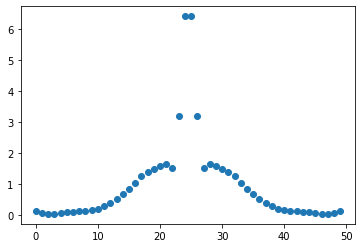

In [11]:
plt.plot((output - output_true).pow(2).sum(dim=-1).sum(dim=-1).detach(), 'o')

### Plot some examples

In [12]:
i = 0
vmax = 4
scene_dict = dict(xaxis=dict(range=[-vmax, 0]), 
                  yaxis=dict(range=[-vmax, 0]), 
                  zaxis=dict(range=[0, vmax]), aspectmode='cube')
center = centers.detach()[i]
signals = output.detach()[i]
traces = plot_output(center, signals, lmax=4)
layout = go.Layout(scene = dict(aspectmode='data'))
fig = go.Figure(traces, layout)
fig.show()

/usr/lib/python3/dist-packages/attr/filters.py:29: DeprecationWarning:

invalid escape sequence \ 

/usr/lib/python3/dist-packages/attr/filters.py:46: DeprecationWarning:

invalid escape sequence \ 

/usr/lib/python3/dist-packages/attr/_make.py:138: DeprecationWarning:

invalid escape sequence \ 



In [13]:
i = 20
center = centers.detach()[i]
signals = output.detach()[i]
traces = plot_output(center, signals, lmax=4)
layout = go.Layout(scene = dict(aspectmode='data'))
fig = go.Figure(traces, layout)
fig.show()

### Note, that due to the rotation equivariance of the network, there can be symmetrically degenerate situations where it is not possible for the network to output a specific example that has output with lower symmetry than the input.

See ["Finding Symmetry Breaking Order Parameters with Euclidean Neural Networks"](https://arxiv.org/abs/2007.02005) or talk to Tess for more details

In [14]:
i = 25
center = centers.detach()[i]
signals = output.detach()[i]
traces = plot_output(center, signals, lmax=4)
layout = go.Layout(scene = dict(aspectmode='data'))
fig = go.Figure(traces, layout)
fig.show()

### Get peaks from `SphericalTensor` -- COMING SOON
Need to adapt this code to look at two rotated grid so it will get all peaks. It's currently missing a peak that's sitting at the grid seam.

In [15]:
from e3nn.tensor import SphericalTensor
from e3nn.s2grid import ToS2Grid
import scipy
import scipy.signal

def detect_peaks(xyz, proj):
    xyz = torch.cat([xyz, xyz, xyz])
    f = proj

    beta_pass = []
    for i in range(f.size(0)):
        jj, _ = scipy.signal.find_peaks(f[i])
        beta_pass += [(i, j) for j in jj]

    alpha_pass = []
    for j in range(f.size(1)):
        ii, _ = scipy.signal.find_peaks(f[:, j])
        alpha_pass += [(i, j) for i in ii]

    peaks = list(set(beta_pass).intersection(set(alpha_pass)))

    radius = torch.stack([f[i, j] for i, j in peaks]) if peaks else torch.empty(0)
    peaks = torch.stack([xyz[i, j] for i, j in peaks]) if peaks else torch.empty(0, 3)
    return peaks, radius


vertices = torch.tensor([[ 1.0000,  0.0000, -0.7071],
                         [-1.0000,  0.0000, -0.7071],
                         [ 0.0000,  1.0000,  0.7071],
                         [ 0.0000, -1.0000,  0.7071]])

sph = SphericalTensor.from_geometry(vertices, lmax=4)
grid, proj = sph.signal_on_grid(res=200)
peaks, radius = detect_peaks(grid.detach(), proj.detach())
print(peaks * radius.unsqueeze(0))

vertices.norm(2, -1)

# trace_kwargs = sph.plotly_surface()
# trace = go.Surface(**trace_kwargs)
# go.Figure([trace])

tensor([[-0.0079, -0.9962,  0.7116],
        [-0.0079,  0.9962,  0.7116],
        [-0.9961,  0.0157, -0.7116]])


tensor([1.2247, 1.2247, 1.2247, 1.2247])